Environment: velocity

In [1]:
import pandas
import scanpy
import hdf5plugin
import anndata
import cellrank
import matplotlib
from matplotlib import pyplot
import cellrank
import numpy
import gseapy
import scipy
import seaborn
import scipy
import decoupler
import scvelo
import IPython
import single_cell_analysis
from pyscenic import aucell
import warnings
import numba

/home/avesta/m26_losu/miniconda3/envs/velocity/lib/python3.12/site-packages/ctxcore/__init__.py:5: UserWarning: pkg_resources is deprecated as an API. See https://setuptools.pypa.io/en/latest/pkg_resources.html. The pkg_resources package is slated for removal as early as 2025-11-30. Refrain from using this package or pin to Setuptools<81.
  from pkg_resources import DistributionNotFound, get_distribution


In [2]:
from importlib import reload

single_cell_analysis = reload(single_cell_analysis)

In [3]:
# Suppress warnings

warnings.simplefilter("ignore", category=UserWarning)

In [4]:
# Plotting setup

scanpy.set_figure_params(dpi=200)

In [5]:
# Load data from Cellrank and SDEvelo

working_directory = "RNA Sequencing Data/"
base_name = "cellrank_version_5"
adata = scanpy.read_h5ad(
    working_directory+f"/diffusion_map_anndata.h5ad"
)
driver_df = pandas.read_csv(
    working_directory+f"{base_name}_driver_genes.csv",
    index_col=0
)
combined_driver_df = pandas.read_csv(
    working_directory+f"{base_name}_driver_genes_combined.csv",
    index_col=0
)
adata.obs["group"] = adata.obs["group"].cat.reorder_categories(["MEF", "mESC", "control", "Hic2"])

In [6]:
# Load adata with raw counts and filter

adata_raw = scanpy.read_h5ad(
    working_directory+f"/splice_counts.h5ad"
)

scanpy.pp.filter_genes(adata_raw, min_cells=20)
scanpy.pp.normalize_total(adata_raw, target_sum=1e6)
scanpy.pp.log1p(adata_raw)
adata_raw.obs = adata.obs
adata_raw.obsm = adata.obsm
adata_raw.uns["term_states_fwd_colors"] = adata.uns["term_states_fwd_colors"]
adata_raw.uns = adata.uns
adata.raw = adata_raw

print(adata_raw)

AnnData object with n_obs × n_vars = 12791 × 20917
    obs: 'barcode', 'batch', 'sample', 'group', 'day', 'seurat_clusters', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'latent_time', 'sde_velocity_self_transition', 'manual_root', 'manual_end', 'sde_velocity_pseudotime', 'leiden', 'macrostates_fwd', 'term_states_fwd', 'term_states_fwd_probs', 'init_states_fwd', 'init_states_fwd_probs', 'fate_probabilities_Dead end', 'fate_probabilities_Stem cell', 'macrostate', 'early_or_late', 'epithelial_score', 'keratinocyte_score', 'stem_cell_score', 'fibroblast_score', 'neuron_score', 'kupffer_score', 'apoptosis_score'
    var: 'ensemble_ids', 'gene_symbol', 'n_cells'
    uns: 'T_fwd_params', 'coarse_fwd', 'diffmap_evals', 'diffmap_neighbors', 'draw_graph', 'eigendecomposition_fwd', 'group_colors', 'init_states_fwd_colors', 'leiden', 'leiden_colors', 'leiden_rank_genes', 'log1p', 'macrostate_

In [7]:
# Read ChIP-seq targets
base_name = "ChIP Sequencing Data/chipseq_targets"

hic2_target_scores = pandas.read_csv(f"{base_name}_hic2_scores.csv", index_col=0)
klf4_hic2_target_scores = pandas.read_csv(f"{base_name}_klf4_hic2_scores.csv", index_col=0)
klf4_control_target_scores = pandas.read_csv(f"{base_name}_klf4_control_scores.csv", index_col=0)

hic2_targets = numpy.loadtxt(f"{base_name}_hic2_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_hic2_targets = numpy.loadtxt(f"{base_name}_klf4_hic2_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_control_targets = numpy.loadtxt(f"{base_name}_klf4_control_targets.txt", dtype=numpy.dtypes.StrDType)
klf4_targets = numpy.intersect1d(klf4_hic2_targets, klf4_control_targets)
shared_targets = numpy.intersect1d(hic2_targets, klf4_targets)

In [8]:
# Load bulk differential expression results

bulk_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_combined.csv", index_col=0)
bulk_metadata = pandas.read_csv("RNA Sequencing Data/bulk_sequencing_metadata.csv", index_col=0)
samples = bulk_metadata.index.to_list()
reprogramming_columns = bulk_de.columns[bulk_de.columns.str.contains("Reprogramming")]
reprogramming_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_reprogramming.csv", index_col=0)
mef_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_mef.csv", index_col=0)
mesc_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_mesc.csv", index_col=0)
ipsc_de = pandas.read_csv("RNA Sequencing Data/bulk_differential_expression_ipsc.csv", index_col=0)

In [9]:
# Variable genes and Cellrank drivers
variable_genes = adata.var_names.to_numpy()
variable_in_bulk = numpy.intersect1d(variable_genes, bulk_de.index.to_numpy())
stem_cell_drivers = driver_df.sort_values("Dead end_corr", ascending=True).head(100).index.to_numpy()
dead_end_drivers = driver_df.sort_values("Dead end_corr", ascending=False).head(100).index.to_numpy()

In [10]:
# Load list of transcription factors

tf_df = pandas.read_csv("ChIP Sequencing Data/Mus_musculus_TF.txt", sep="\t")
tf_array = tf_df["Symbol"].to_numpy()

differentially_expressed_genes = reprogramming_de.loc[variable_in_bulk].query("padj < 0.05").index.to_numpy()

# All target transcription factors
target_tfs = numpy.intersect1d(shared_targets, tf_array)

# Target transcription factors for which Hic2 changes expression significantly
de_target_tfs = numpy.intersect1d(target_tfs, differentially_expressed_genes)

# Differentially expressed targets that are drivers of dead end
de_dead_end_drivers = numpy.intersect1d(de_target_tfs, dead_end_drivers)

# Differentially expressed targets that are drivers of stem cells
de_stem_cell_drivers = numpy.intersect1d(de_target_tfs, stem_cell_drivers)

# Score activities

In [11]:
network_genes = ["Hic2", "Klf4", "Myc"]

In [12]:
# Get gene sets

cell_markers = gseapy.get_library("PanglaoDB_Augmented_2021", organism="Mouse")
epithelial_markers = numpy.array(pandas.Series(cell_markers["Epithelial Cells"]).str.capitalize())
keratinocyte_markers = numpy.array(pandas.Series(cell_markers["Keratinocytes"]).str.capitalize())
stem_cell_markers = numpy.array(pandas.Series(cell_markers["Pluripotent Stem Cells"]).str.capitalize())
fibroblast_markers = numpy.array(pandas.Series(cell_markers["Fibroblasts"]).str.capitalize())
msigdb = gseapy.get_library("MSigDB_Hallmark_2020", organism="Mouse")
p53_markers = numpy.array(pandas.Series(msigdb["p53 Pathway"]).str.capitalize())

2026-04-08 08:48:19 | [INFO] Downloading and generating Enrichr library gene sets...
2026-04-08 08:48:19 | [INFO] Library is already downloaded in: /home/avesta/m26_losu/.cache/gseapy/Enrichr.PanglaoDB_Augmented_2021.gmt, use local file
2026-04-08 08:48:20 | [INFO] Downloading and generating Enrichr library gene sets...
2026-04-08 08:48:20 | [INFO] Library is already downloaded in: /home/avesta/m26_losu/.cache/gseapy/Enrichr.MSigDB_Hallmark_2020.gmt, use local file


In [13]:
# Define gene signatures

dead_end_de_df = pandas.read_csv("RNA Sequencing Data/macrostate_differential_expression_Dead end.csv", index_col=0)

p53_top_1000 = numpy.intersect1d(p53_markers, dead_end_de_df.head(1000).index)

signatures = {
    "fibroblast": fibroblast_markers,
    "keratinocyte": keratinocyte_markers,
    "stem_cell": stem_cell_markers,
    "p53": p53_top_1000
}

aucell_signatures = {}
for name, genes in signatures.items():
    valid_genes = [gene for gene in genes if gene in adata_raw.var_names]
    weight_dict = {gene: 1.0 for gene in valid_genes}
    aucell_signature = aucell.GeneSignature(name, weight_dict)
    aucell_signatures[name] = aucell_signature

In [14]:
# Run AUCell

expression_matrix = pandas.DataFrame(
    adata_raw.X.todense(), 
    index=adata_raw.obs.index, 
    columns=adata_raw.var_names
)
rank_matrix = aucell.create_rankings(expression_matrix)
result = aucell.aucell4r(rank_matrix, aucell_signatures.values())

# Add AUCell scores to adata and adata_raw

for gene_set in result.columns:
    adata.obs[f"{gene_set}_score"] = result[gene_set].copy()
    adata_raw.obs[f"{gene_set}_score"] = result[gene_set].copy()

network_scores = ["keratinocyte_score", "stem_cell_score", "p53_score"]

In [15]:
# Score activities of Hic2, Klf4 and Myc

conditions = ["Reprogramming", "MEF", "mESC", "iPSC", "Single-cell"]
lfc_columns = [f"{condition} LFC" for condition in conditions]
pval_columns = [f"{condition} p adjusted" for condition in conditions]

consistently_downregulated_df = bulk_de
for condition in conditions:
    consistently_downregulated_df = consistently_downregulated_df.query(f"`{condition} LFC` < 0")

consistently_downregulated = consistently_downregulated_df.index.to_list()
bulk_chipseq = numpy.intersect1d(consistently_downregulated, hic2_targets)
expression_df = pandas.DataFrame(data = adata.raw.X.toarray(), index=adata.obs_names, columns=adata.raw.var_names)
correlations = expression_df.drop(columns=["Hic2"]).corrwith(expression_df["Hic2"], method="pearson")
bulk_and_correlation = numpy.intersect1d(bulk_chipseq, correlations[correlations < -0.1].index)
weights = bulk_de.loc[bulk_and_correlation]["Single-cell LFC"]
hic2_network = pandas.DataFrame({"source": "Hic2", "weight": weights, "target": bulk_and_correlation})

# Load collectri
collectri_df = decoupler.op.collectri(organism="mouse")
# Remove unreliable signs
modified_collectri = collectri_df.query("sign_decision != 'default activation'")
# Remove autoregulation
modified_collectri = modified_collectri.query("not (source == target)")

# Combine CollecTRI and Hic2 network
collectri_genes = ["Klf4", "Myc"]
myc_klf4_network = modified_collectri.query("source in @collectri_genes")[["source", "target", "weight"]]
network = pandas.concat([hic2_network, myc_klf4_network])

In [16]:
# Run ULM

decoupler.mt.ulm(adata, network, raw=True, bsize=1000000)
network_activities = []
for gene in network_genes:
    adata.obs[f"{gene}_activity"] = adata.obsm["score_ulm"][gene]
    network_activities.append(f"{gene}_activity")

In [17]:
# Rescale scores between 0 and 1

# For AUCell scores, set the max value to 1
for score in network_scores:
    max_value = numpy.max(adata.obs[score])
    adata.obs[score] /= max_value

# For ULM scores, bound them between 0 and 1
for activity in network_activities:
    adata.obs[activity] -= numpy.min(adata.obs[activity])
    adata.obs[activity] /= numpy.max(adata.obs[activity])

# Trends in real time

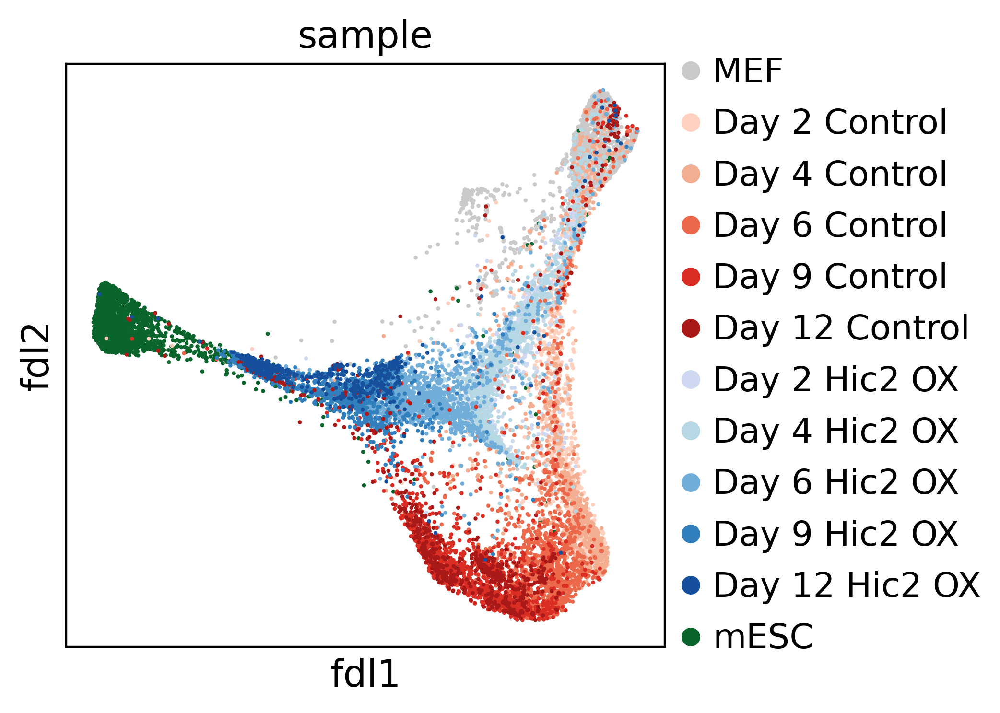

In [18]:
scanpy.pl.embedding(adata, "fdl", color=["sample"])

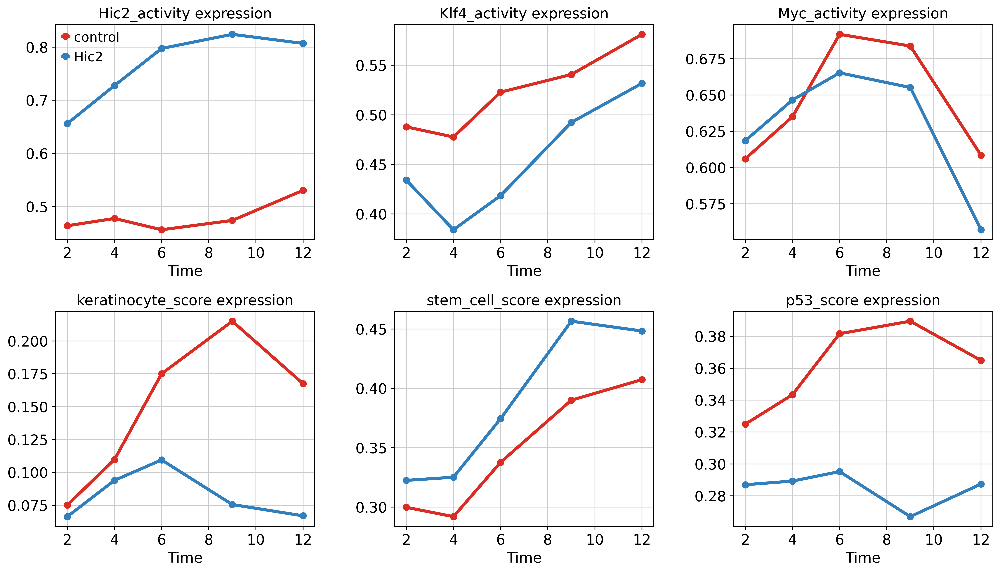

In [19]:
def plot_average_over_time(adata, genes, group_key="group", time_key="day", layer=None, groups="all", columns=4, figure_width=14, plot_height=4,
    obsm=False, show=True, errorbars=False):
    """
    Plots smoothed gene expression using generalized additive models (GAMs).
    This provides true smooth local regression with confidence intervals.
    """

    number_of_genes = len(genes)
    number_of_columns = min(columns, number_of_genes)
    
    # Calculate rows
    rows = (number_of_genes + number_of_columns - 1) // number_of_columns
    
    figure, axes = pyplot.subplots(rows, number_of_columns)
    figure.set_figwidth(figure_width)
    figure.set_figheight(plot_height * rows)

    # Handle single gene case (axes is not an array) and 1D array case
    if number_of_genes == 1:
        axes_flat = [axes]
    else:
        axes_flat = axes.flatten()

    # Define colors for groups
    unique_groups = adata.obs[group_key].cat.categories
    if f"{group_key}_colors" in adata.uns_keys():
        palette = adata.uns[f"{group_key}_colors"]
        color_map = dict(zip(unique_groups, palette))
    else:
        palette = seaborn.color_palette("tab10", n_colors=len(unique_groups))
        color_map = dict(zip(unique_groups, palette))


    for gene_index, gene in enumerate(genes):
        axis = axes_flat[gene_index]
        
        # Fetch expression data
        if obsm:
            expr_data = adata.obsm[layer][gene]
        else:
            if (layer == None and gene in adata.obs_keys()) or layer == "obs":
                expr_data = adata.obs[gene]
            elif layer == "raw":
                expr_data = adata.raw.to_adata()[:, gene].X
            elif layer == "X" or layer == None:
                expr_data = adata[:, gene].X
            else:
                expr_data = adata[:, gene].layers[layer]
        if hasattr(expr_data, "toarray"):
            expr_data = expr_data.toarray()
        if hasattr(expr_data, "flatten"):
            expr_data = expr_data.flatten()
        
        # Create DataFrame
        df = pandas.DataFrame({
            "Latent Time": adata.obs[time_key],
            "Expression": expr_data,
            "Group": adata.obs[group_key]
        })
        
        # Determine which groups to plot
        if groups is None:
            # If no specific list, plot all groups found in the data
            plot_groups = df["Group"].unique()
        else:
            plot_groups = groups

        # Loop through each group and plot expression
        for group in plot_groups:
            group_data = df[df["Group"] == group]
            color = color_map[group]
            
            # Skip empty groups
            if len(group_data) < 10:
                continue

            # Prepare X and y
            X = group_data["Latent Time"].values
            y = group_data["Expression"].values

            time_points = group_data["Latent Time"].unique()
            
            # Calculate average expression
            averages = []
            ci_list = []
            for t in time_points:
                y_t = y[X == t]
                averages.append(y_t.mean())
                ci_list.append(scipy.stats.norm.ppf(0.975)*y_t.std())
            
            # Plot line
            axis.plot(time_points, averages, "o", linestyle="solid", label=group, color=color, linewidth=3)
            if errorbars:
                axis.errorbar(time_points, averages, yerr=ci_list, color=color, elinewidth=3, capsize=10)

        axis.set_title(f"{gene} expression")
        axis.set_xlabel("Time")
        
        # Add legend to the first plot
        if gene_index == 0:
            axis.legend()

    # Clean up empty subplots
    for i in range(number_of_genes, len(axes_flat)):
        axes_flat[i].axis('off')

    pyplot.tight_layout()
    if show:
        pyplot.show()
    else:
        return axes_flat
    
plot_average_over_time(adata, genes=network_activities+network_scores, groups=["control", "Hic2"], columns=3)

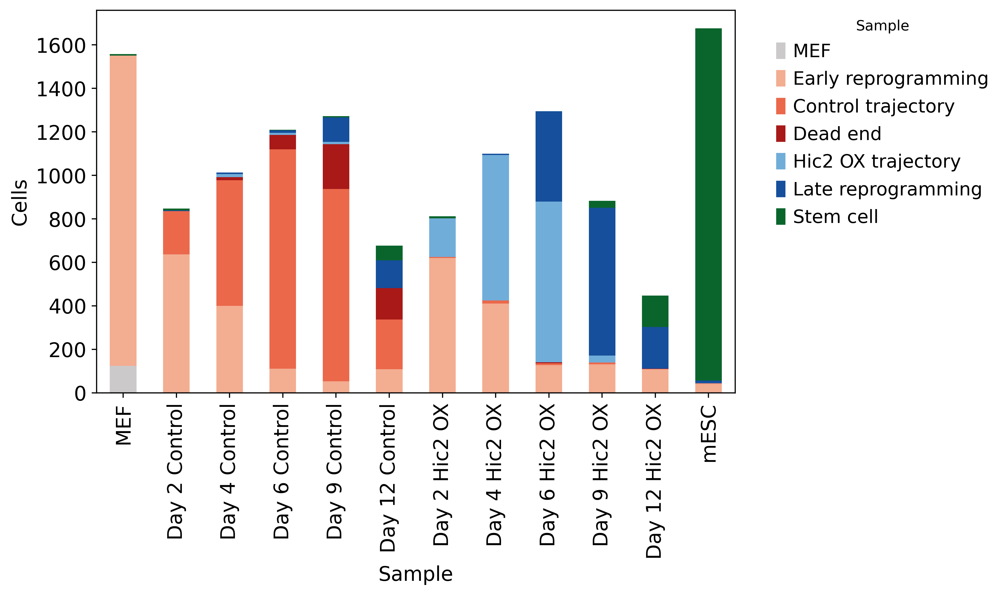

In [20]:
# Macrostate compositions in samples

single_cell_analysis.plot_group_composition(adata, group_key="sample", sample_key="macrostate", normalize=False)

# Plot trends for network components

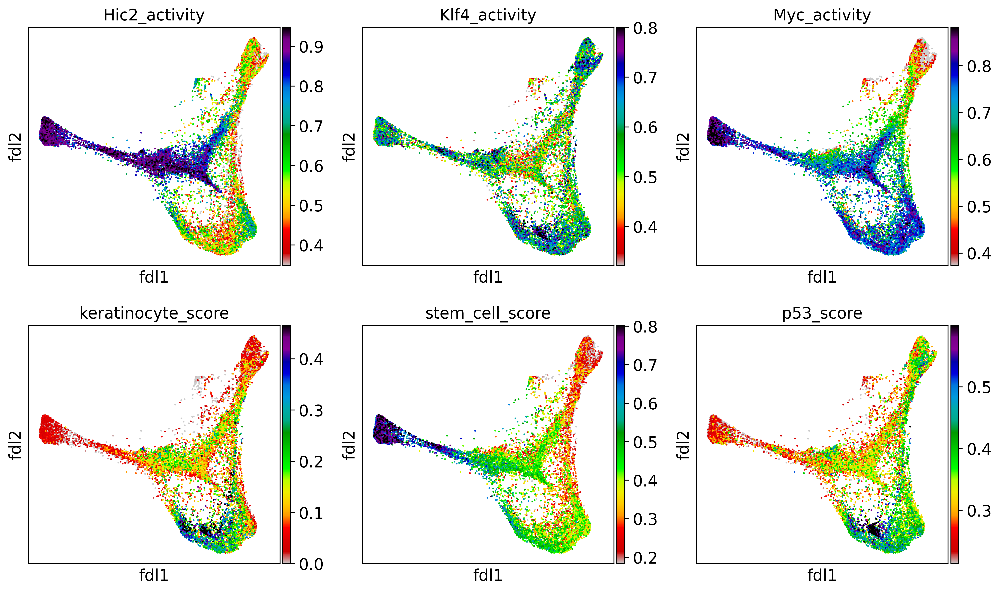

In [21]:
scanpy.pl.embedding(adata, "fdl", color=network_activities+network_scores, cmap="nipy_spectral_r", vmax="p99", vmin="p10", ncols=3)

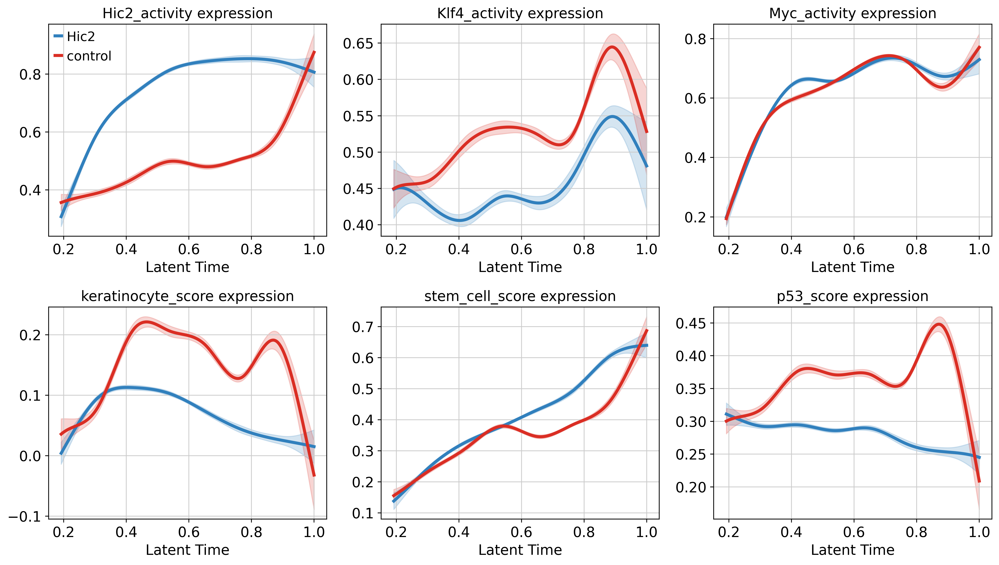

In [22]:
single_cell_analysis.plot_grouped_gene_trend(adata, network_activities+network_scores, groups=["Hic2", "control"], columns=3, n_splines=10)

2026-04-08 08:48:56 | [INFO] cffi mode is CFFI_MODE.ANY
2026-04-08 08:48:56 | [INFO] R home found: /home/avesta/m26_losu/miniconda3/envs/velocity/lib/R
2026-04-08 08:48:56 | [INFO] R library path: 
2026-04-08 08:48:56 | [INFO] LD_LIBRARY_PATH: 
2026-04-08 08:48:56 | [INFO] Default options to initialize R: rpy2, --quiet, --no-save
2026-04-08 08:48:56 | [INFO] Environment variable "PWD" redefined by R and overriding existing variable. Current: "/home/avesta/m26_losu", R: "/home/avesta/m26_losu/hic2_masters_project"
2026-04-08 08:48:57 | [INFO] R is already initialized. No need to initialize.


  0%|          | 0/6 [00:00<?, ?gene/s]

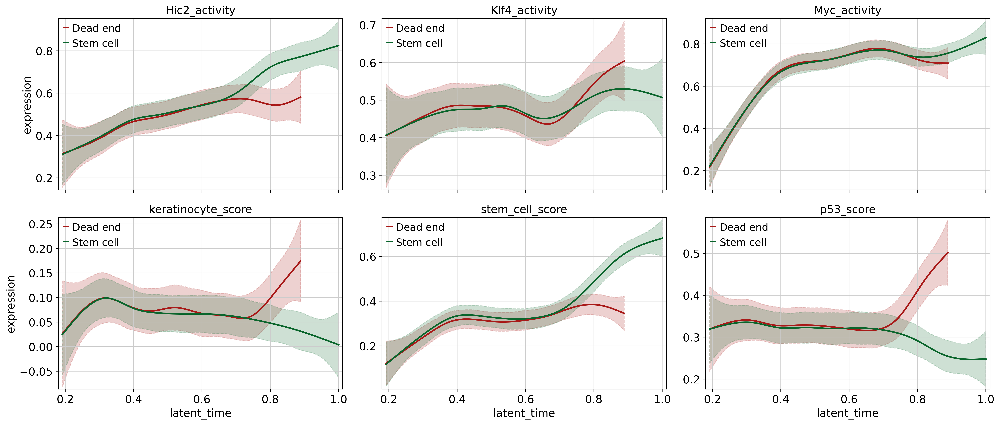

In [23]:
single_cell_analysis.plot_trends_by_trajectory(adata, network_activities+network_scores, group_key="group", groups=["control"], n_knots=10, n_columns=3)

  0%|          | 0/6 [00:00<?, ?gene/s]

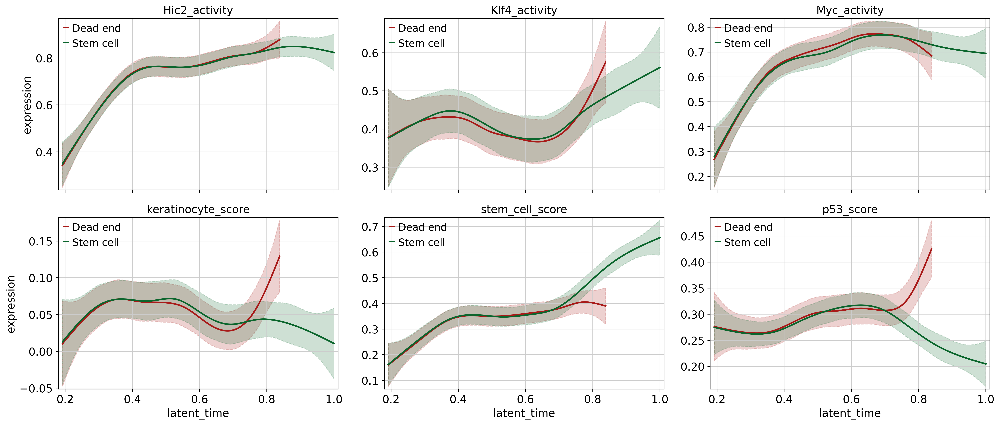

In [24]:
single_cell_analysis.plot_trends_by_trajectory(adata, network_activities+network_scores, group_key="group", groups=["Hic2"], n_knots=10, n_columns=3)

# Functions for integrating stochastic differential equations

To do:
- Define equations
- Find good way to estimate starting concentrations
- Find good way to measure goodness-of-fit

In [24]:
# Solver for stochastic differential equations
@numba.njit()
def euler_maruyama(time_array, derivatives_function, initial_values,
                     negatives = True, seed=None, parameters = numpy.empty(0)):
    species = initial_values.size
    dt = time_array[1] - time_array[0]
    concentration_matrix = numpy.zeros((time_array.size, species))
    concentration_matrix[0] = initial_values
    
    if not seed is None:
        numpy.random.seed(seed)
    
    for step_index in range(1, len(time_array)):
        t = time_array[step_index]
        xi = numpy.random.normal()
        concentrations = concentration_matrix[step_index-1]
        dc = derivatives_function(t, concentrations, dt, parameters)
        if negatives:
            new_concentrations = concentrations + dc
        else:
            new_concentrations = numpy.clip(concentrations + dc, a_min=0, a_max=None)
        concentration_matrix[step_index] = new_concentrations.copy()
    return concentration_matrix.T.copy()

In [25]:
@numba.njit()
def derivatives_function(time, concentrations, dt, parameters):

    # unpack state variables
    H = concentrations[0]
    K = concentrations[1]
    M = concentrations[2]
    E = concentrations[3]
    S = concentrations[4]
    D = concentrations[5]

    # unpack parameters
    alpha_H = parameters[0]
    alpha_K = parameters[1]
    alpha_M = parameters[2]
    alpha_E = parameters[3]
    alpha_S = parameters[4]
    alpha_MD = parameters[5]
    alpha_KD = parameters[6]
    alpha_DD = parameters[7]
    
    beta_H = parameters[8]
    beta_K = parameters[9]
    beta_M = parameters[10]
    
    delta_H = parameters[11]
    delta_K = parameters[12]
    delta_M = parameters[13]
    delta_E = parameters[14]
    delta_S = parameters[15]
    delta_D = parameters[16]
    
    eta_KH = parameters[17]
    eta_HH = parameters[18]
    eta_MK = parameters[19]
    eta_SK = parameters[20]
    eta_HK = parameters[21]
    eta_KK = parameters[22]
    eta_KM = parameters[23]
    eta_HM = parameters[24]
    eta_MM = parameters[25]
    eta_SM = parameters[26]
    eta_KE = parameters[27]
    eta_EE = parameters[28]
    eta_HE = parameters[29]
    eta_SE = parameters[30]
    eta_KS = parameters[31]
    eta_MS = parameters[32]
    eta_SS = parameters[33]
    eta_ES = parameters[34]
    eta_DS = parameters[35]
    eta_MD = parameters[36]
    eta_KD = parameters[37]
    eta_DD = parameters[38]
    eta_SD = parameters[39]
    
    kappa_KH = parameters[40]
    kappa_HH = parameters[41]
    kappa_MK = parameters[42]
    kappa_SK = parameters[43]
    kappa_HK = parameters[44]
    kappa_KK = parameters[45]
    kappa_KM = parameters[46]
    kappa_HM = parameters[47]
    kappa_MM = parameters[48]
    kappa_SM = parameters[49]
    kappa_KE = parameters[50]
    kappa_EE = parameters[51]
    kappa_HE = parameters[52]
    kappa_SE = parameters[53]
    kappa_KS = parameters[54]
    kappa_MS = parameters[55]
    kappa_SS = parameters[56]
    kappa_ES = parameters[57]
    kappa_DS = parameters[58]
    kappa_MD = parameters[59]
    kappa_KD = parameters[60]
    kappa_DD = parameters[61]
    kappa_SD = parameters[62]

    sigma_H = parameters[63]
    sigma_K = parameters[64]
    sigma_M = parameters[65]
    sigma_E = parameters[66]
    sigma_S = parameters[67]
    sigma_D = parameters[68]

    # compute deterministic drift terms
    drift_H = alpha_H * (kappa_KH * K**eta_KH) / (1 + kappa_KH * K**eta_KH + kappa_HH * H**eta_HH) + beta_H - delta_H * H
    drift_K = alpha_K * (kappa_MK * M**eta_MK + kappa_SK * S**eta_SK) / (1 + kappa_MK * M**eta_MK + kappa_SK * S**eta_SK + kappa_HK * H**eta_HK + kappa_KK * K**eta_KK) + beta_K - delta_K * K
    drift_M = alpha_M * (kappa_KM * K**eta_KM) / (1 + kappa_KM * K**eta_KM + kappa_HM * H**eta_HM + kappa_MM * M**eta_MM + kappa_SM * S**eta_SM) + beta_M - delta_M * M
    drift_E = alpha_E * (kappa_KE * K**eta_KE + kappa_EE * E**eta_EE) / (1 + kappa_KE * K**eta_KE + kappa_EE * E**eta_EE + kappa_HE * H**eta_HE + kappa_SE * S**eta_SE) - delta_E * E
    drift_S = alpha_S * (kappa_KS * K**eta_KS + kappa_MS * M**eta_MS + kappa_SS * S**eta_SS) / (1 + kappa_KS * K**eta_KS + kappa_MS * M**eta_MS + kappa_SS * S**eta_SS + kappa_ES * E**eta_ES + kappa_DS * D**eta_DS) - delta_S * S
    drift_D = alpha_MD * (kappa_MD * M**eta_MD) / (1 + kappa_MD * M**eta_MD) + alpha_KD * (kappa_KD * K**eta_KD) / (1 + kappa_KD * K**eta_KD) + alpha_DD * (kappa_DD * D**eta_DD) / (1 + kappa_DD * D**eta_DD + kappa_SD * S**eta_SD) - delta_D * D

    # calculate increments using the Euler-Maruyama method
    dH = drift_H * dt + sigma_H * numpy.sqrt(dt) * numpy.random.normal()
    dK = drift_K * dt + sigma_K * numpy.sqrt(dt) * numpy.random.normal()
    dM = drift_M * dt + sigma_M * numpy.sqrt(dt) * numpy.random.normal()
    dE = drift_E * dt + sigma_E * numpy.sqrt(dt) * numpy.random.normal()
    dS = drift_S * dt + sigma_S * numpy.sqrt(dt) * numpy.random.normal()
    dD = drift_D * dt + sigma_D * numpy.sqrt(dt) * numpy.random.normal()

    return numpy.array([dH, dK, dM, dE, dS, dD])

In [83]:
@numba.njit()
def myc_damage(time, concentrations, dt, parameters):

    # Concentrations
    H = concentrations[0]
    K = concentrations[1]
    M = concentrations[2]
    E = concentrations[3]
    S = concentrations[4]
    D = concentrations[5]

    # Parameters
    alpha_H = parameters[0]
    alpha_K = parameters[1]
    alpha_M = parameters[2]
    alpha_E = parameters[3]
    alpha_S = parameters[4]
    alpha_MD = parameters[5]
    alpha_DD = parameters[6]
    
    beta_H = parameters[7]
    beta_K = parameters[8]
    beta_M = parameters[9]
    
    delta_H = parameters[10]
    delta_K = parameters[11]
    delta_M = parameters[12]
    delta_E = parameters[13]
    delta_S = parameters[14]
    delta_D = parameters[15]
    
    eta_KH = parameters[16]
    eta_HH = parameters[17]
    eta_MK = parameters[18]
    eta_SK = parameters[19]
    eta_HK = parameters[20]
    eta_KK = parameters[21]
    eta_KM = parameters[22]
    eta_HM = parameters[23]
    eta_MM = parameters[24]
    eta_SM = parameters[25]
    eta_KE = parameters[26]
    eta_EE = parameters[27]
    eta_HE = parameters[28]
    eta_SE = parameters[29]
    eta_KS = parameters[30]
    eta_MS = parameters[31]
    eta_SS = parameters[32]
    eta_ES = parameters[33]
    eta_DS = parameters[34]
    eta_MD = parameters[35]
    eta_HMD = parameters[36]
    eta_DD = parameters[37]
    
    kappa_KH = parameters[38]
    kappa_HH = parameters[39]
    kappa_MK = parameters[40]
    kappa_SK = parameters[41]
    kappa_HK = parameters[42]
    kappa_KK = parameters[43]
    kappa_KM = parameters[44]
    kappa_HM = parameters[45]
    kappa_MM = parameters[46]
    kappa_SM = parameters[47]
    kappa_KE = parameters[48]
    kappa_EE = parameters[49]
    kappa_HE = parameters[50]
    kappa_SE = parameters[51]
    kappa_KS = parameters[52]
    kappa_MS = parameters[53]
    kappa_SS = parameters[54]
    kappa_ES = parameters[55]
    kappa_DS = parameters[56]
    kappa_MD = parameters[57]
    kappa_HMD = parameters[58]
    kappa_DD = parameters[59]

    sigma_H = parameters[60]
    sigma_K = parameters[61]
    sigma_M = parameters[62]
    sigma_E = parameters[63]
    sigma_S = parameters[64]
    sigma_D = parameters[65]

    # Deterministic drift terms
    drift_H = alpha_H * ((K / kappa_KH)**eta_KH) / (1 + (K / kappa_KH)**eta_KH + (H / kappa_HH)**eta_HH) + beta_H - delta_H * H
    
    drift_K = alpha_K * ((M / kappa_MK)**eta_MK + (S / kappa_SK)**eta_SK) / (1 + (M / kappa_MK)**eta_MK + (S / kappa_SK)**eta_SK + (H / kappa_HK)**eta_HK + (K / kappa_KK)**eta_KK) + beta_K - delta_K * K
    
    drift_M = alpha_M * ((K / kappa_KM)**eta_KM) / (1 + (K / kappa_KM)**eta_KM + (H / kappa_HM)**eta_HM + (M / kappa_MM)**eta_MM + (S / kappa_SM)**eta_SM) + beta_M - delta_M * M
    
    drift_E = alpha_E * ((K / kappa_KE)**eta_KE + (E / kappa_EE)**eta_EE) / (1 + (K / kappa_KE)**eta_KE + (E / kappa_EE)**eta_EE + (H / kappa_HE)**eta_HE + (S / kappa_SE)**eta_SE) - delta_E * E
    
    drift_S = alpha_S * ((K / kappa_KS)**eta_KS + (M / kappa_MS)**eta_MS + (S / kappa_SS)**eta_SS) / (1 + (K / kappa_KS)**eta_KS + (M / kappa_MS)**eta_MS + (S / kappa_SS)**eta_SS + (E / kappa_ES)**eta_ES + (D / kappa_DS)**eta_DS) - delta_S * S
    
    drift_D = alpha_MD * ((M / kappa_MD)**eta_MD) / (1 + (M / kappa_MD)**eta_MD + (H / kappa_HMD)**eta_HMD) + alpha_DD * ((D / kappa_DD)**eta_DD) / (1 + (D / kappa_DD)**eta_DD) - delta_D * D

    # Integrate with Euler-Maruyama
    dH = drift_H * dt + sigma_H * numpy.sqrt(dt) * numpy.random.normal()
    dK = drift_K * dt + sigma_K * numpy.sqrt(dt) * numpy.random.normal()
    dM = drift_M * dt + sigma_M * numpy.sqrt(dt) * numpy.random.normal()
    dE = drift_E * dt + sigma_E * numpy.sqrt(dt) * numpy.random.normal()
    dS = drift_S * dt + sigma_S * numpy.sqrt(dt) * numpy.random.normal()
    dD = drift_D * dt + sigma_D * numpy.sqrt(dt) * numpy.random.normal()

    return numpy.array([dH, dK, dM, dE, dS, dD])

In [89]:
# Read parameter values

parameter_value_df = pandas.read_csv("myc_parameter_values.csv")
default_parameters = parameter_value_df["start_value"].to_numpy()
control_parameters = default_parameters.copy()
control_parameters[7] = 0

# Plotting functions

In [27]:
# Function for plotting concentrations

def plot_concentrations(time_array, concentration_matrix, species_names, species_colors=None):
    n_species = concentration_matrix.shape[0]
    if species_colors == None:
        species_colors = seaborn.color_palette("tab10", n_colors=n_species)
    figure, axis = pyplot.subplots()
    for species_index, species in enumerate(species_names):
        species_color = species_colors[species_index]
        axis.plot(time_array, concentration_matrix[species_index], label=species, color=species_color)
    axis.legend()
    axis.grid(True)
    axis.set_xlabel("Time")
    axis.set_ylabel("Concentration")
    pyplot.show()

In [28]:
# Function for plotting concentrations

def plot_trajectories(time_array, trajectories, species_names, species_colors=None, alpha=1.0, n_columns=3, figure_width=12, row_height=4):
    if len(trajectories.shape) == 2:
        trajectories = trajectories.reshape((1, trajectories.shape[0], trajectories.shape[1]))
    n_species = trajectories.shape[1]
    n_trajectories = trajectories.shape[0]
    n_time_points = len(time_array)
    if species_colors == None:
        species_colors = seaborn.color_palette("tab10", n_colors=n_species)
    n_columns = min(n_columns, n_species)
    n_rows = (n_species + n_columns - 1) // n_columns
    figure, axes = pyplot.subplots(n_rows, n_columns)
    if n_species == 1:
        axes_flat = [axes]
    else:
        axes_flat = axes.flatten()
    for species_index, species in enumerate(species_names):
        axis = axes_flat[species_index]
        species_color = species_colors[species_index]
        for trajectory in trajectories[:, species_index].reshape((n_trajectories, n_time_points)):
            # Only plot label for one trajectory

            axis.plot(time_array, trajectory, color=species_color, alpha=alpha)
        axis.grid(True)
        axis.set_title(species)
        axis.set_xlabel("Time")
        axis.set_ylabel("Concentration")
    figure.set_figwidth(figure_width)
    figure.set_figheight(row_height * n_rows)
    pyplot.tight_layout()
    pyplot.show()

In [29]:
variable_names = ["Hic2", "Klf4", "Myc", "Keratinocyte", "Stem cell", "p53 activity"]
variable_colors = ["#3180bd", "#a93ee1", "#dc8c20", "#eb684b", "#0a652c", "#a81918"]

# Define initial concentrations

In [38]:
# Get average MEF concentrations

initial_concentrations = numpy.array([
    adata[(adata.obs["group"] == "MEF")].obs["Hic2_activity"].mean(),
    adata[(adata.obs["group"] == "MEF")].obs["Klf4_activity"].mean(),
    adata[(adata.obs["group"] == "MEF")].obs["Myc_activity"].mean(),
    adata[(adata.obs["group"] == "MEF")].obs["keratinocyte_score"].mean(),
    adata[(adata.obs["group"] == "MEF")].obs["stem_cell_score"].mean(),
    adata[(adata.obs["group"] == "MEF")].obs["p53_score"].mean(),
])
print(initial_concentrations)

[0.42824609 0.50011864 0.38712297 0.01940317 0.21774414 0.28570408]


It might be useful to randomly sample a fibroblast to use as the starting point instead, at least in the stochastic model.

In [39]:
# List of variable values in MEFs

mef_values = numpy.array([
    adata[(adata.obs["group"] == "MEF")].obs["Hic2_activity"].to_numpy(),
    adata[(adata.obs["group"] == "MEF")].obs["Klf4_activity"].to_numpy(),
    adata[(adata.obs["group"] == "MEF")].obs["Myc_activity"].to_numpy(),
    adata[(adata.obs["group"] == "MEF")].obs["keratinocyte_score"].to_numpy(),
    adata[(adata.obs["group"] == "MEF")].obs["stem_cell_score"].to_numpy(),
    adata[(adata.obs["group"] == "MEF")].obs["p53_score"].to_numpy(),
]).T
print(mef_values.shape)

(1558, 6)


# Test stochastic simulations

In [34]:
time_span = [0, 12]
dt = 1e-2

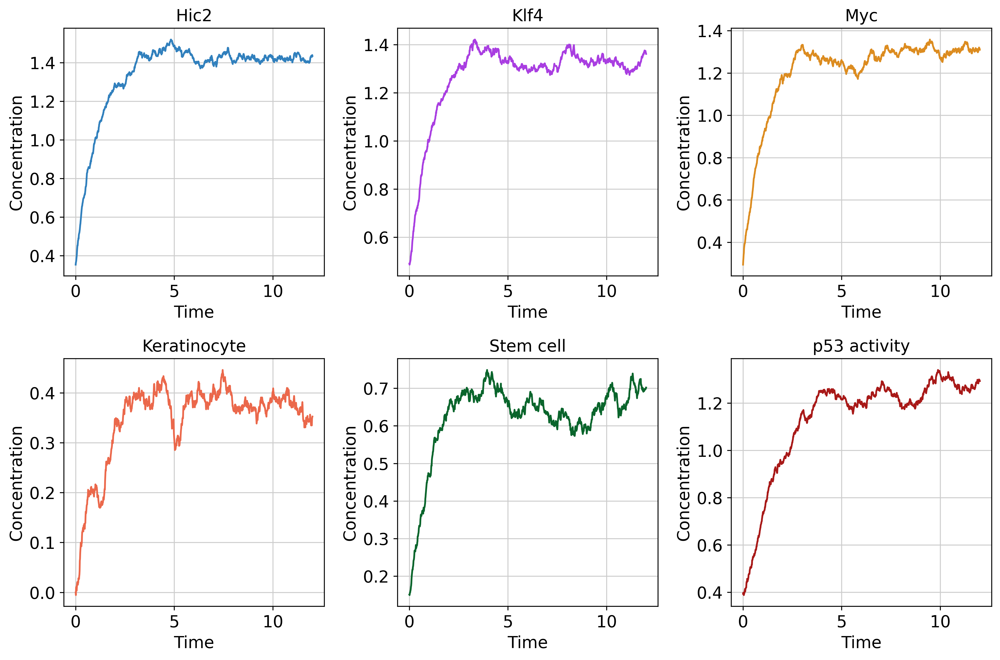

In [90]:
time_array = numpy.arange(time_span[0], time_span[1]+dt, dt)
numpy.random.seed(0)
cell_index = numpy.random.randint(len(mef_values))
cell_concentrations = mef_values[cell_index]
concentration_matrix = euler_maruyama(time_array, myc_damage, cell_concentrations, negatives=True, seed=2, parameters=default_parameters)
plot_trajectories(time_array, concentration_matrix, species_names=variable_names, species_colors=variable_colors)

In [41]:
# Function for generating trajectories

@numba.njit
def generate_trajectories(time_span, derivatives_function, dt=1e-1,
                     seed=0, parameters = numpy.empty(0), n_trajectories=1000):
    time_array = numpy.arange(time_span[0], time_span[1]+dt, dt)
    n_time_points = len(time_array)
    n_species = len(mef_values[0])
    results = numpy.empty((n_trajectories, n_species, n_time_points))
    n_mef_cells = len(mef_values)
    numpy.random.seed(seed)
    for i in range(n_trajectories):
        initial_cell_index = numpy.random.randint(n_mef_cells)
        initial_concentrations = mef_values[initial_cell_index]
        concentration_matrix = euler_maruyama(time_array, derivatives_function, initial_concentrations, seed=None, parameters=parameters)
        results[i] = concentration_matrix
    return time_array, results

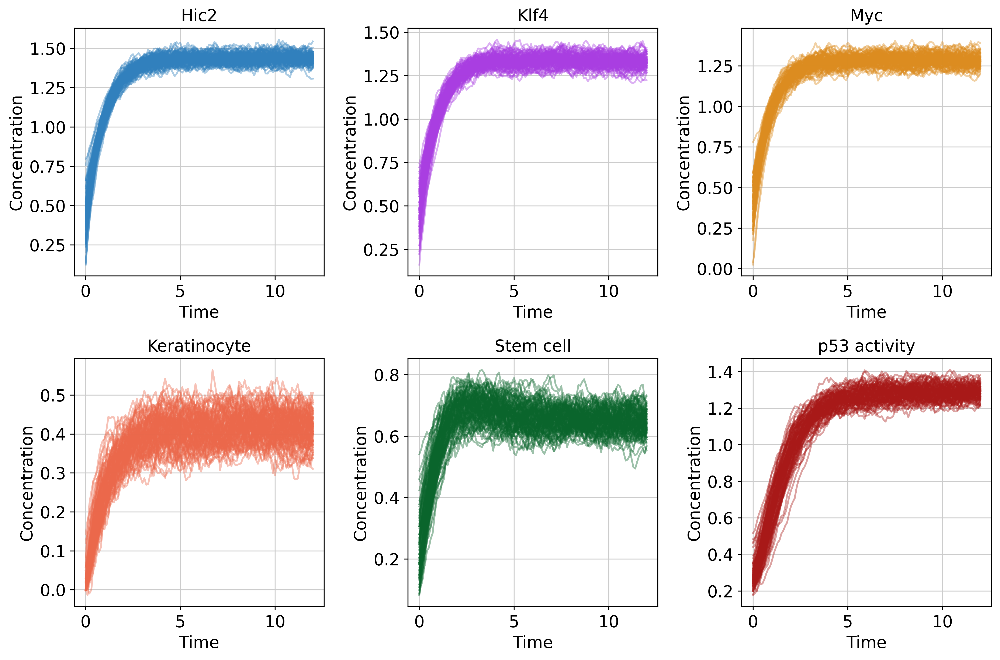

In [91]:
# Generate and plot trajectories with Hic2 OX

time_array, trajectories = generate_trajectories(time_span, myc_damage, dt=1e-1, seed=0, parameters=default_parameters, n_trajectories=100)
plot_trajectories(time_array, trajectories, species_names=variable_names, species_colors=variable_colors, alpha=0.4)

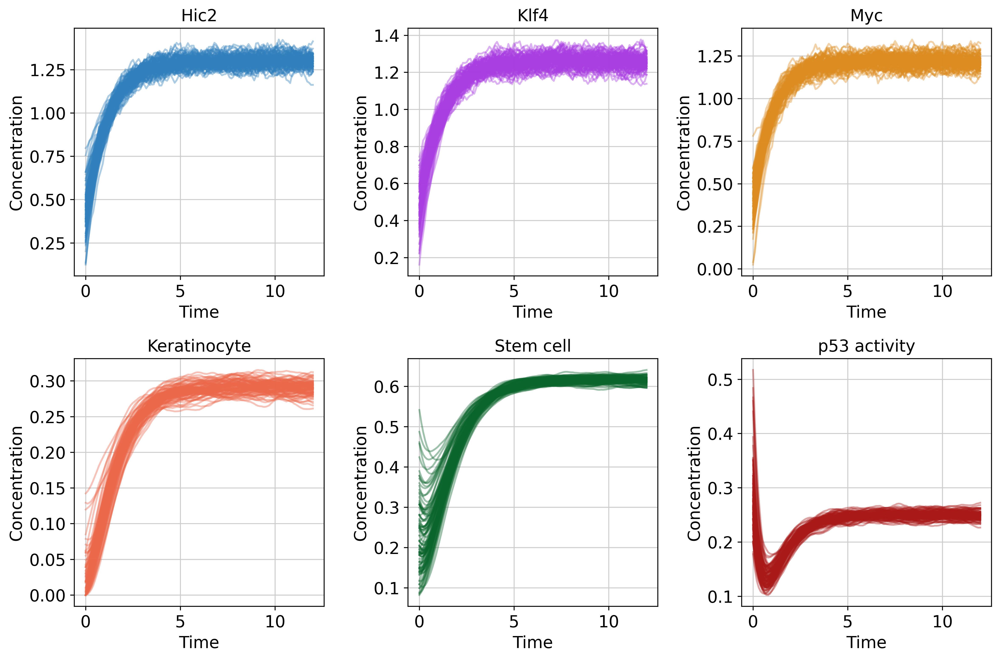

In [92]:
# Control trajectories

time_array, trajectories = generate_trajectories(time_span, derivatives_function, dt=1e-1, seed=0, parameters=control_parameters, n_trajectories=100)
plot_trajectories(time_array, trajectories, species_names=variable_names, species_colors=variable_colors, alpha=0.4)

In [93]:
%timeit generate_trajectories(time_span, myc_damage, dt=1e-1, seed=0, parameters=default_parameters, n_trajectories=1000)

51.2 ms ± 1.38 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


With dt = 1e-3, 1000 trajectories can be generated in 530 ms. It scales linearly with number of time points, so dt = 1e-2 only takes 54.4 ms.

## Test maximum mean discrepancy

In [66]:
# extract real data and time from the anndata object

adata_hic2 = adata[adata.obs["group"] == "Hic2"]
hic2_concentrations = numpy.array([
    adata_hic2.obs["Hic2_activity"].to_numpy(),
    adata_hic2.obs["Klf4_activity"].to_numpy(),
    adata_hic2.obs["Myc_activity"].to_numpy(),
    adata_hic2.obs["keratinocyte_score"].to_numpy(),
    adata_hic2.obs["stem_cell_score"].to_numpy(),
    adata_hic2.obs["p53_score"].to_numpy(),
]).T
hic2_time = adata_hic2.obs["day"].to_numpy(dtype=float)

adata_control = adata[adata.obs["group"] == "control"]
control_concentrations = numpy.array([
    adata_control.obs["Hic2_activity"].to_numpy(),
    adata_control.obs["Klf4_activity"].to_numpy(),
    adata_control.obs["Myc_activity"].to_numpy(),
    adata_control.obs["keratinocyte_score"].to_numpy(),
    adata_control.obs["stem_cell_score"].to_numpy(),
    adata_control.obs["p53_score"].to_numpy(),
]).T
control_time = adata_control.obs["day"].to_numpy(dtype=float)

In [75]:
# MMD function

@numba.njit
def mmd_rbf(X, Y, bandwidths):
    n_X = X.shape[0]
    n_Y = Y.shape[0]
    n_features = X.shape[1]
    n_bandwidths = bandwidths.shape[0]

    # precompute inverse bandwidths to replace division with multiplication
    inv_two_bandwidths = numpy.zeros(n_bandwidths)
    for b in range(n_bandwidths):
        inv_two_bandwidths[b] = 1.0 / (2.0 * bandwidths[b])

    sum_XX = 0.0
    for i in range(n_X):
        for j in range(i):
            distance_squared = 0.0
            for k in range(n_features):
                distance_squared += (X[i, k] - X[j, k])**2
            for b in range(n_bandwidths):
                sum_XX += 2.0 * numpy.exp(-distance_squared * inv_two_bandwidths[b])

    sum_YY = 0.0
    for i in range(n_Y):
        for j in range(i):
            distance_squared = 0.0
            for k in range(n_features):
                distance_squared += (Y[i, k] - Y[j, k])**2
            for b in range(n_bandwidths):
                sum_YY += 2.0 * numpy.exp(-distance_squared * inv_two_bandwidths[b])

    sum_XY = 0.0
    for i in range(n_X):
        for j in range(n_Y):
            distance_squared = 0.0
            for k in range(n_features):
                distance_squared += (X[i, k] - Y[j, k])**2
            for b in range(n_bandwidths):
                sum_XY += numpy.exp(-distance_squared * inv_two_bandwidths[b])

    mmd_squared = (sum_XX / (n_X * (n_X - 1.0))) - (2.0 * sum_XY / (n_X * n_Y)) + (sum_YY / (n_Y * (n_Y - 1.0)))
    loss = max(0.0, mmd_squared)
    return loss

@numba.njit
def mmd_cost_function(time_array, trajectories, real_time, real_concentrations):
    # bandwidths = numpy.array([0.01, 0.1, 0.5, 1, 10])
    # bandwidths = numpy.array([0.5])
    bandwidths = numpy.array([0.1, 1, 5])
    
    mmd_total = 0.0
    unique_times = numpy.unique(real_time)

    for i in range(len(unique_times)):
        time = unique_times[i]
        
        real_time_indices = numpy.where(real_time == time)[0]
        real_concentrations_timepoint = real_concentrations[real_time_indices]
        
        sim_time_index = numpy.argmax(time_array == time)
        sim_data_timepoint = trajectories[:, :, sim_time_index]

        mmd_total += mmd_rbf(real_concentrations_timepoint, sim_data_timepoint, bandwidths)

    return mmd_total

In [76]:
# Time MMD function

# execute the simulation
time_array, results = generate_trajectories(time_span, derivatives_function, n_trajectories=500, parameters=default_parameters)

print(mmd_cost_function(time_array, results, hic2_time, hic2_concentrations))
%timeit mmd_cost_function(time_array, results, hic2_time, hic2_concentrations)

22.507451771937443
75.1 ms ± 1.04 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


In [77]:
# If using median as bandwidth

@numba.njit
def calculate_median_bandwidth(X, Y):
    # compute the median of all squared pairwise distances in the joint sample
    n_X = X.shape[0]
    n_Y = Y.shape[0]
    n_features = X.shape[1]
    n_total = n_X + n_Y
    
    n_pairs = (n_total * (n_total - 1)) // 2
    sq_distances = numpy.zeros(n_pairs)
    idx = 0
    
    # distances within X
    for i in range(n_X):
        for j in range(i + 1, n_X):
            dist_sq = 0.0
            for k in range(n_features):
                dist_sq += (X[i, k] - X[j, k])**2
            sq_distances[idx] = dist_sq
            idx += 1
            
    # distances within Y
    for i in range(n_Y):
        for j in range(i + 1, n_Y):
            dist_sq = 0.0
            for k in range(n_features):
                dist_sq += (Y[i, k] - Y[j, k])**2
            sq_distances[idx] = dist_sq
            idx += 1
            
    # distances between X and Y
    for i in range(n_X):
        for j in range(n_Y):
            dist_sq = 0.0
            for k in range(n_features):
                dist_sq += (X[i, k] - Y[j, k])**2
            sq_distances[idx] = dist_sq
            idx += 1
            
    median_sq_dist = numpy.median(sq_distances)
    
    # prevent division by zero if all points are identical
    if median_sq_dist == 0.0:
        median_sq_dist = 1e-5
        
    return numpy.array([median_sq_dist])

@numba.njit
def mmd_cost_function_median(time_array, trajectories, real_time, real_concentrations):
    mmd_total = 0.0
    unique_times = numpy.unique(real_time)

    for i in range(len(unique_times)):
        time = unique_times[i]
        
        real_time_indices = numpy.where(real_time == time)[0]
        real_concentrations_timepoint = real_concentrations[real_time_indices]
        
        sim_time_index = numpy.where(time_array == time)[0][0]
        sim_data_timepoint = trajectories[:, :, sim_time_index]

        # calculate the exact median bandwidth for the current timepoint
        dynamic_bandwidth = calculate_median_bandwidth(real_concentrations_timepoint, sim_data_timepoint)

        mmd_total += mmd_rbf(real_concentrations_timepoint, sim_data_timepoint, dynamic_bandwidth)

    return mmd_total

print(mmd_cost_function_median(time_array, results, hic2_time, hic2_concentrations))
%timeit mmd_cost_function_median(time_array, results, hic2_time, hic2_concentrations)

8.277526485730078
76.5 ms ± 4.82 ms per loop (mean ± std. dev. of 7 runs, 10 loops each)


For bad fits, the median distance squared is typically between 0.5 and 2.5. The median method could make optimization more difficult since loss depends both on parameters and bandwidth. With 500 trajectories, using three bandwidths is as fast as calculating the median.

In [78]:
# Compare with Sinkhorn Wasserstein

@numba.njit
def sinkhorn_wasserstein(X, Y, epsilon=0.1, max_iter=100):
    n_X = X.shape[0]
    n_Y = Y.shape[0]
    n_features = X.shape[1]

    # initialize uniform marginal distributions
    a = numpy.ones(n_X) / n_X
    b = numpy.ones(n_Y) / n_Y

    # compute the squared euclidean cost matrix
    C = numpy.zeros((n_X, n_Y))
    for i in range(n_X):
        for j in range(n_Y):
            dist_sq = 0.0
            for k in range(n_features):
                dist_sq += (X[i, k] - Y[j, k])**2
            C[i, j] = dist_sq

    # compute the gibbs kernel
    K = numpy.exp(-C / epsilon)

    # initialize scaling vectors
    u = numpy.ones(n_X) / n_X
    v = numpy.ones(n_Y) / n_Y

    # sinkhorn iterations
    for iteration in range(max_iter):
        for j in range(n_Y):
            dot_Ku = 0.0
            for i in range(n_X):
                dot_Ku += K[i, j] * u[i]
            v[j] = b[j] / (dot_Ku + 1e-15)

        for i in range(n_X):
            dot_Kv = 0.0
            for j in range(n_Y):
                dot_Kv += K[i, j] * v[j]
            u[i] = a[i] / (dot_Kv + 1e-15)

    # compute the final regularized wasserstein distance
    wasserstein_dist = 0.0
    for i in range(n_X):
        for j in range(n_Y):
            transport_plan = u[i] * K[i, j] * v[j]
            wasserstein_dist += transport_plan * C[i, j]

    return wasserstein_dist

@numba.njit
def wasserstein_cost_function(time_array, trajectories, real_time, real_concentrations):
    wasserstein_total = 0.0
    unique_times = numpy.unique(real_time)

    for i in range(len(unique_times)):
        time = unique_times[i]
        
        real_time_indices = numpy.where(real_time == time)[0]
        real_concentrations_timepoint = real_concentrations[real_time_indices]
        
        sim_time_index = numpy.where(time_array == time)[0][0]
        sim_data_timepoint = trajectories[:, :, sim_time_index]

        # epsilon controls the trade-off between exactness and convergence speed
        wasserstein_total += sinkhorn_wasserstein(
            real_concentrations_timepoint, 
            sim_data_timepoint, 
            epsilon=0.1
        )

    return wasserstein_total

print(wasserstein_cost_function(time_array, results, hic2_time, hic2_concentrations))
%timeit wasserstein_cost_function(time_array, results, hic2_time, hic2_concentrations)

0.0975299548608458
223 ms ± 3.36 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


The Wasserstein distance is much slower than maximum mean discrepancy.

In [ ]:
# Function for evaluating parameters

@numba.njit
def evaluate_parameters(parameters, loss_function=mmd_cost_function, time_span=(0.2, 1.0), derivatives_function=myc_damage, n_trajectories=1000, seed=0, dt=1e-3):
    # Run Hic2 simulation
    time_array, hic2_results = generate_trajectories(time_span, derivatives_function, dt, seed, parameters=parameters, n_trajectories=n_trajectories)
    # Run control simulation
    control_parameters = parameters.copy()
    control_parameters[8] = 0 # Set beta_H to 0
    time_array, control_results = generate_trajectories(time_span, derivatives_function, dt, seed, parameters=control_parameters, n_trajectories=n_trajectories)

    hic2_loss = loss_function(time_array, hic2_results, hic2_time, hic2_concentrations)
    control_loss = loss_function(time_array, control_results, control_time, control_concentrations)
    loss = hic2_loss + control_loss

    return loss

print(evaluate_parameters(default_parameters))
%timeit evaluate_parameters(default_parameters, n_trajectories=500, dt=1e-1)

7.358386679053536
163 ms ± 5.16 ms per loop (mean ± std. dev. of 7 runs, 1 loop each)


500 control and 500 Hic2 trajectories can be tested in < 200 ms with MMD with three bandwidths and dt=1e-1. This seems to be sufficient for an accurate loss estimation. When there are $n$ real samples and $m$ simulated samples the error scales proportionally to $1/\sqrt{n} + 1/\sqrt{m}$. 1000 trajectories takes about 300 ms.

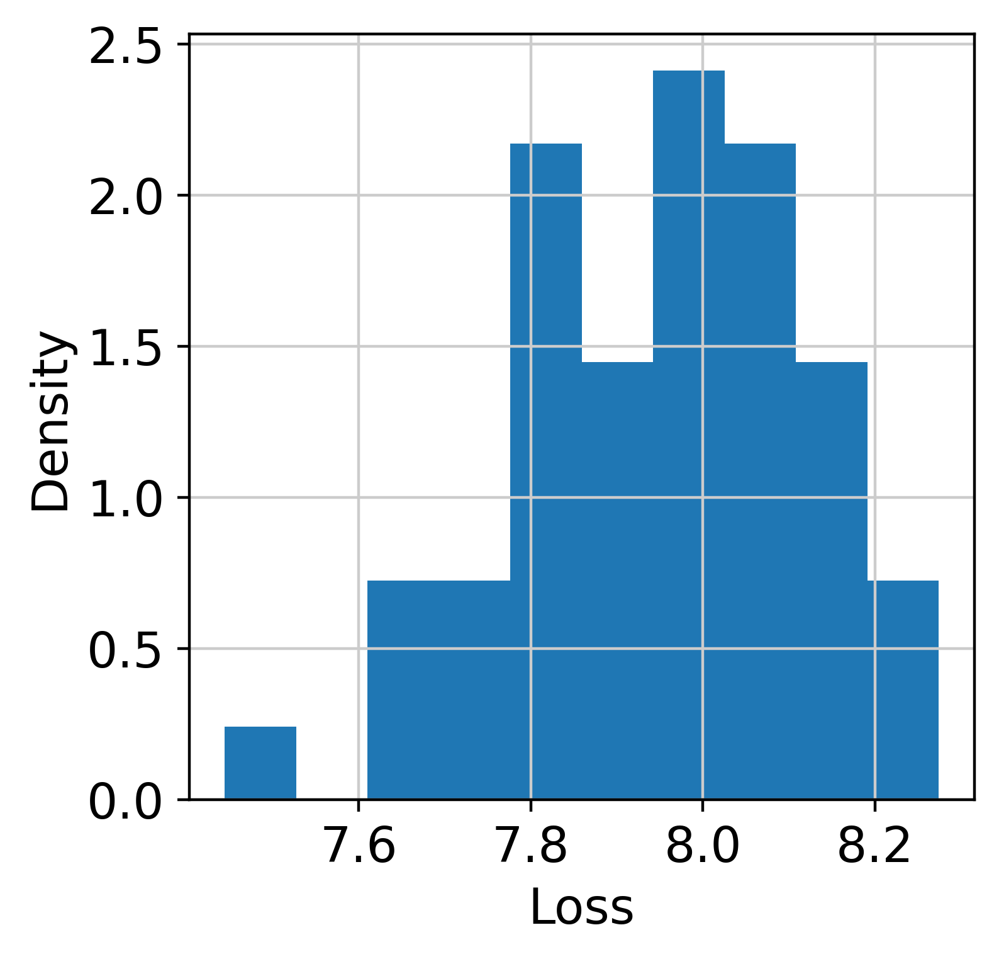

In [ ]:
# Spread of loss with 500 trajectories
loss_list = []
for seed in range(50):
    loss = evaluate_parameters(default_parameters, seed=seed, n_trajectories=500)
    loss_list.append(loss)
figure, axis = pyplot.subplots()
axis.hist(loss_list, density=True)
axis.set_xlabel("Loss")
axis.set_ylabel("Density")
axis.grid(True)
pyplot.show()

# Quick deterministic optimization

In [97]:
@numba.njit()
def derivatives_function_deterministic(time, concentrations, parameters):

    # Concentrations
    H = concentrations[0]
    K = concentrations[1]
    M = concentrations[2]
    E = concentrations[3]
    S = concentrations[4]
    D = concentrations[5]

    # Parameters
    alpha_H = parameters[0]
    alpha_K = parameters[1]
    alpha_M = parameters[2]
    alpha_E = parameters[3]
    alpha_S = parameters[4]
    alpha_MD = parameters[5]
    alpha_DD = parameters[6]
    
    beta_H = parameters[7]
    beta_K = parameters[8]
    beta_M = parameters[9]
    
    delta_H = parameters[10]
    delta_K = parameters[11]
    delta_M = parameters[12]
    delta_E = parameters[13]
    delta_S = parameters[14]
    delta_D = parameters[15]
    
    eta_KH = parameters[16]
    eta_HH = parameters[17]
    eta_MK = parameters[18]
    eta_SK = parameters[19]
    eta_HK = parameters[20]
    eta_KK = parameters[21]
    eta_KM = parameters[22]
    eta_HM = parameters[23]
    eta_MM = parameters[24]
    eta_SM = parameters[25]
    eta_KE = parameters[26]
    eta_EE = parameters[27]
    eta_HE = parameters[28]
    eta_SE = parameters[29]
    eta_KS = parameters[30]
    eta_MS = parameters[31]
    eta_SS = parameters[32]
    eta_ES = parameters[33]
    eta_DS = parameters[34]
    eta_MD = parameters[35]
    eta_HMD = parameters[36]
    eta_DD = parameters[37]
    
    kappa_KH = parameters[38]
    kappa_HH = parameters[39]
    kappa_MK = parameters[40]
    kappa_SK = parameters[41]
    kappa_HK = parameters[42]
    kappa_KK = parameters[43]
    kappa_KM = parameters[44]
    kappa_HM = parameters[45]
    kappa_MM = parameters[46]
    kappa_SM = parameters[47]
    kappa_KE = parameters[48]
    kappa_EE = parameters[49]
    kappa_HE = parameters[50]
    kappa_SE = parameters[51]
    kappa_KS = parameters[52]
    kappa_MS = parameters[53]
    kappa_SS = parameters[54]
    kappa_ES = parameters[55]
    kappa_DS = parameters[56]
    kappa_MD = parameters[57]
    kappa_HMD = parameters[58]
    kappa_DD = parameters[59]

    # Deterministic drift terms
    drift_H = alpha_H * ((K / kappa_KH)**eta_KH) / (1 + (K / kappa_KH)**eta_KH + (H / kappa_HH)**eta_HH) + beta_H - delta_H * H
    
    drift_K = alpha_K * ((M / kappa_MK)**eta_MK + (S / kappa_SK)**eta_SK) / (1 + (M / kappa_MK)**eta_MK + (S / kappa_SK)**eta_SK + (H / kappa_HK)**eta_HK + (K / kappa_KK)**eta_KK) + beta_K - delta_K * K
    
    drift_M = alpha_M * ((K / kappa_KM)**eta_KM) / (1 + (K / kappa_KM)**eta_KM + (H / kappa_HM)**eta_HM + (M / kappa_MM)**eta_MM + (S / kappa_SM)**eta_SM) + beta_M - delta_M * M
    
    drift_E = alpha_E * ((K / kappa_KE)**eta_KE + (E / kappa_EE)**eta_EE) / (1 + (K / kappa_KE)**eta_KE + (E / kappa_EE)**eta_EE + (H / kappa_HE)**eta_HE + (S / kappa_SE)**eta_SE) - delta_E * E
    
    drift_S = alpha_S * ((K / kappa_KS)**eta_KS + (M / kappa_MS)**eta_MS + (S / kappa_SS)**eta_SS) / (1 + (K / kappa_KS)**eta_KS + (M / kappa_MS)**eta_MS + (S / kappa_SS)**eta_SS + (E / kappa_ES)**eta_ES + (D / kappa_DS)**eta_DS) - delta_S * S
    
    drift_D = alpha_MD * ((M / kappa_MD)**eta_MD) / (1 + (M / kappa_MD)**eta_MD + (H / kappa_HMD)**eta_HMD) + alpha_DD * ((D / kappa_DD)**eta_DD) / (1 + (D / kappa_DD)**eta_DD) - delta_D * D

    return numpy.array([drift_H, drift_K, drift_M, drift_E, drift_S, drift_D])

In [98]:
print(*[default_parameters])

[1.   1.   1.   1.   1.   1.   1.   1.   1.   1.   1.   1.   1.   1.
 1.   1.   2.   2.   2.   2.   2.   2.   2.   2.   2.   2.   2.   2.
 2.   2.   2.   2.   2.   2.   2.   2.   2.   2.   0.5  0.5  0.5  0.5
 0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5  0.5
 0.5  0.5  0.5  0.5  0.05 0.05 0.05 0.05 0.05 0.05]


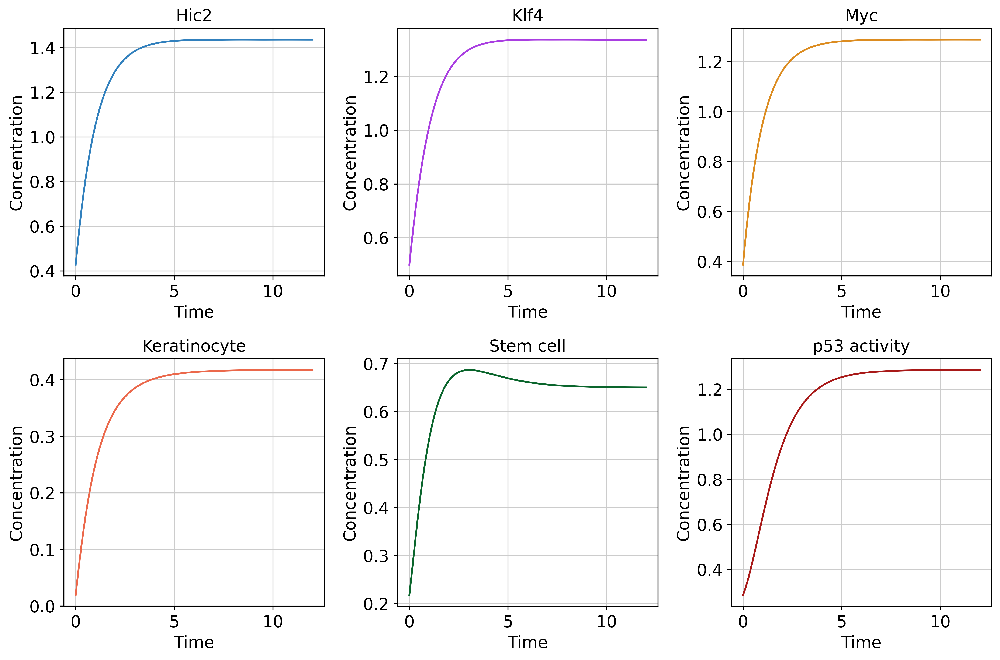

In [99]:
result = scipy.integrate.solve_ivp(derivatives_function_deterministic, t_span=time_span, y0=initial_concentrations, args=[default_parameters], t_eval=time_array)
plot_trajectories(result.t, result.y, species_names=variable_names, species_colors=variable_colors, alpha=1)

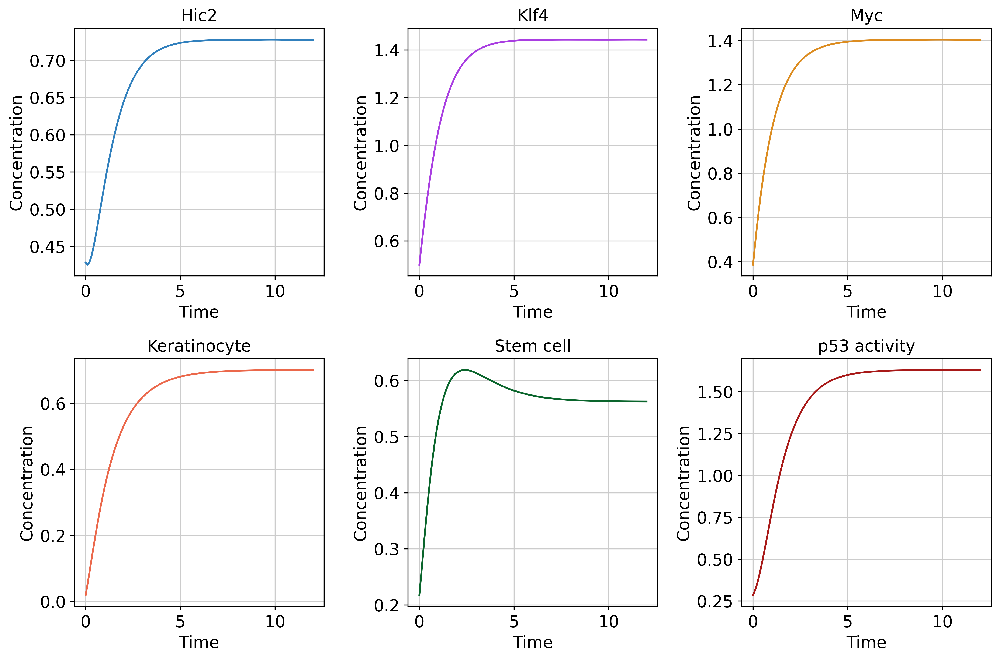

In [101]:
# Control system
result = scipy.integrate.solve_ivp(derivatives_function_deterministic, t_span=time_span, y0=initial_concentrations, args=[control_parameters], t_eval=time_array)
plot_trajectories(result.t, result.y, species_names=variable_names, species_colors=variable_colors, alpha=1)